In [3]:
%load_ext autoreload
%autoreload 2

import numpy as np
import torch
import math
from functools import partial
from matplotlib import pyplot as plt
import random
import seaborn as sns
from matplotlib import cm
from mpl_toolkits.mplot3d.axes3d import Axes3D
from pathlib import Path

import jax
import jax.numpy as jnp
from jax import grad, jit, vmap, jacobian

from sklearn.linear_model import LinearRegression
from tqdm import tqdm

from src.kernel_estimation import (
    Lambda,
    gauss,
    compute_lambda_d,
    Kernel,
    kernel_estimator,
    plot_kernels)

from src.manifolds import (
    example_1d_density,
    compute_norm_constant,
    plot_example_1d_density,
    plot_example_1d_densities,
    examlpe_1d_density_sampling,
    example_parametric_curve,

    example_2d_density,
    example_2d_density_sampling,
    plot_example_2d_density,
    example_parametric_surface

)

from src.utils import (collect_mse_convergence,
    collect_mse_convergence_adaptation,
    plot_convergence)

key = jax.random.PRNGKey(0)

pi = np.pi


In [4]:
!rm -r figs
!mkdir figs

In [5]:
figpath = Path('figs')

## Kernels

In [6]:
x = torch.linspace(-1.5, 1.5, 100).unsqueeze(-1)

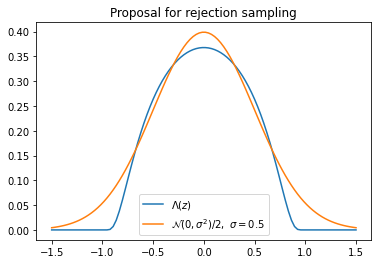

In [7]:
plt.plot(x[:, 0], Lambda(x), label=r'$\Lambda(z)$')
plt.plot(x[:, 0], gauss(x)/2, label=r'$\mathcal{N}(0, \sigma^2) / 2, ~\sigma=0.5$')

plt.title('Proposal for rejection sampling')
plt.legend()
plt.show()

In [8]:
lambda_d = compute_lambda_d(1)

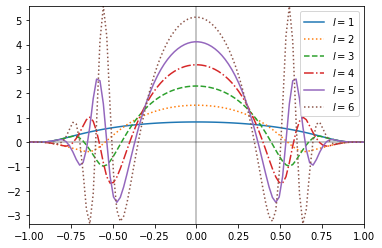

In [9]:
plot_kernels(1,2,3,4,5,6, savepath='figs/kernels.png')

 ## 1d submanifold

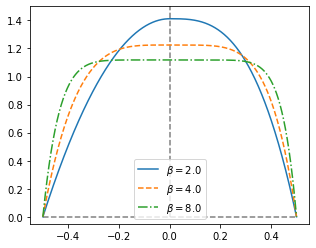

In [10]:
plot_example_1d_densities(savepath='figs/1d_densities.png')

In [11]:
pts = examlpe_1d_density_sampling(2., int(1e4))

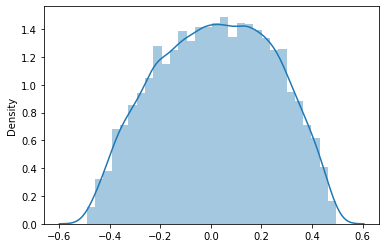

In [12]:
sns.distplot(pts.tolist())
plt.show()

In [13]:
a = 1./8
w = 6

In [14]:
grad_f = vmap(jax.jacobian(partial(example_parametric_curve, a=a, w=w)))


In [15]:
linsp = torch.linspace(0, 1, 1000)


manifold_pts = example_parametric_curve(linsp, a=a, w=w)

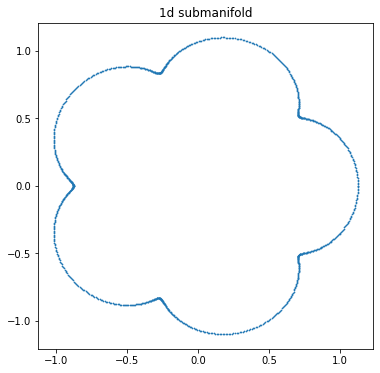

In [16]:
fig = plt.figure(figsize=(6,6))
plt.scatter(manifold_pts[:, 0], manifold_pts[:, 1], s=.5)
plt.title('1d submanifold')
plt.show()

In [17]:
beta = 2.

In [18]:
pts = examlpe_1d_density_sampling(beta, int(1e3))
manifold_pts = example_parametric_curve(pts, a=1./8, w=6.)

In [19]:
pts.shape

torch.Size([1000])

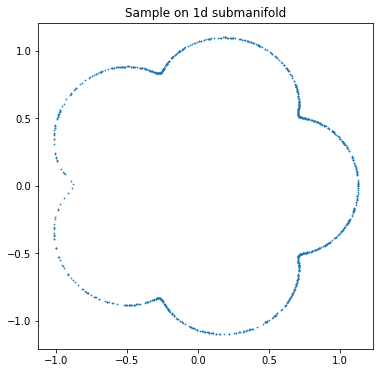

In [20]:
fig = plt.figure(figsize=(6,6))
plt.scatter(manifold_pts[:, 0], manifold_pts[:, 1], s=.5)
plt.title('Sample on 1d submanifold')
plt.show()

In [21]:
def submonifold_density(v):
    transformed = example_parametric_curve(v, a=a, w=w)
    grad = grad_f(jnp.array(v.numpy()))[:, 0, :]
    #print(grad.shape)
    grad = torch.tensor(np.array(grad))
    dens = example_1d_density(v, beta=beta) / grad.norm(p=2, dim=-1)

    return dens

In [22]:
dens = submonifold_density(pts)
dens = dens.detach().cpu().numpy()
print(dens.max())

0.63079554


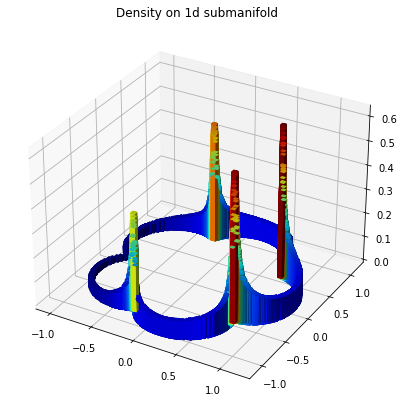

In [23]:
import matplotlib.colors as colors

fig = plt.figure(figsize=(7, 7))
ax1 = fig.add_subplot(111, projection='3d')
#ax2 = fig.add_subplot(122, projection='3d')

offset = dens + np.abs(dens.min())
fracs = offset.astype(float)/offset.max()
norm = colors.Normalize(fracs.min(), fracs.max())
colors = cm.jet(norm(fracs))

ax1.bar3d(manifold_pts[:, 0], manifold_pts[:, 1], 0, 0.05, 0.05, dens, shade=True, color=colors)

plt.title('Density on 1d submanifold')
plt.show()

## Convergence

In [24]:
expected_rate = -.8
d = 1
beta = 2.

x = torch.tensor([1. + a, 0.])

unnormed_g = partial(example_1d_density, beta=beta)
norm_const = compute_norm_constant(unnormed_g, -.5, .5, n_pts=10000)

def density_at_zero(norm_const, a, w):
    return 1. / (norm_const * 2 * pi * (1. + a * w))

f_gt = density_at_zero(norm_const, a, w)

print(f_gt.item())

def sample_f(beta, n_pts):
    pts = examlpe_1d_density_sampling(beta, int(n_pts))
    manifold_pts = example_parametric_curve(pts, a=a, w=w)
    return manifold_pts

0.12839803099632263


21it [00:10,  1.94it/s]
Estimated rate: -0.8003, expected rate: -0.8


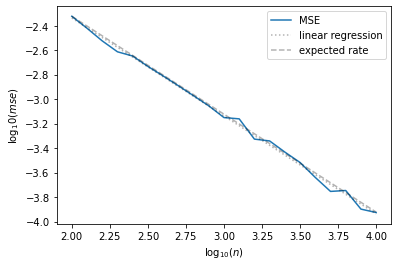

In [25]:
N = 500
grid = np.logspace(np.log(100) / np.log(10), np.log(1e4) / np.log(10), 21)
#beta = 2
l = beta

kernel = Kernel(l, d)

coef, bias, mse_n = collect_mse_convergence(beta, kernel, sample_f, x, f_gt, grid, N)
grid = grid[:len(mse_n)]

print(f'Estimated rate: {coef[0]:.4f}, expected rate: {expected_rate}')

plot_convergence(grid, mse_n, coef, bias, expected_rate, savepath=f'figs/1d_manifold_experiment_l={int(l)}.png')

11it [01:56, 10.63s/it]
Estimated rate: -0.8159, expected rate: -0.8


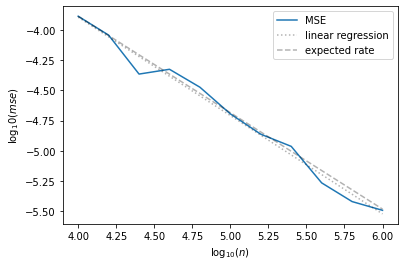

In [26]:
N = 100
grid = np.logspace(np.log(1e4) / np.log(10), np.log(1e6) / np.log(10), 11)
l = 2.

kernel = Kernel(l, d)

coef, bias, mse_n = collect_mse_convergence(beta, kernel, sample_f, x, f_gt, grid, N) #, f_max, theta)
grid = grid[:len(mse_n)]

print(f'Estimated rate: {coef[0]:.4f}, expected rate: {expected_rate}')

plot_convergence(grid, mse_n, coef, bias, expected_rate, savepath=f'figs/1d_manifold_2_experiment_l={int(l)}.png')

11it [02:57, 16.14s/it]
Estimated rate: -0.0490, expected rate: -0.8


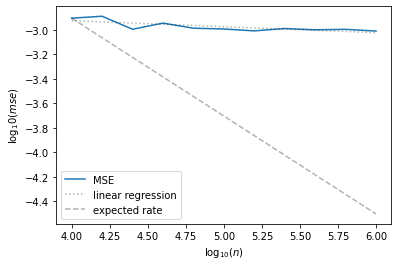

In [27]:
N = 100
grid = np.logspace(np.log(1e4) / np.log(10), np.log(1e6) / np.log(10), 11)
l = 3.

kernel = Kernel(l, d)

coef, bias, mse_n = collect_mse_convergence(beta, kernel, sample_f, x, f_gt, grid, N) #, f_max, theta)
grid = grid[:len(mse_n)]

print(f'Estimated rate: {coef[0]:.4f}, expected rate: {expected_rate}')

plot_convergence(grid, mse_n, coef, bias, expected_rate, savepath=f'figs/1d_manifold_2_experiment_l={int(l)}.png')

## 2d manifold example

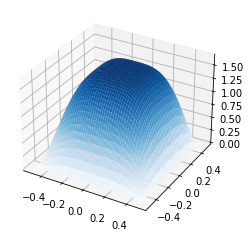

In [28]:
fig = plt.figure()
ax = fig.gca(projection='3d')

surf = plot_example_2d_density(ax, 3.)

#fig.colorbar(surf, shrink=0.5, aspect=5)
plt.savefig('figs/2d_density.png')

In [29]:
b = 3

In [30]:
min_value, max_value = -.5, .5

In [31]:
linsp_x = torch.linspace(min_value, max_value, 1000)
linsp_y = torch.linspace(min_value, max_value, 1000)
mesh = torch.meshgrid(linsp_x, linsp_y)

v = mesh[0].reshape(-1)
u = mesh[1].reshape(-1)


manifold_pts = example_parametric_surface(v, u, a=a, b=b, w=w)

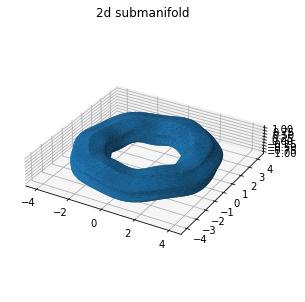

In [32]:
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(111, projection='3d')

manifold_pts = manifold_pts.reshape(1000, 1000, 3)

scale = np.diag([4., 4., 1., 1])
scale=scale*(1.0/scale.max())
scale[3,3]=1.0
ax.get_proj = lambda: np.dot(Axes3D.get_proj(ax), scale)

ax.plot_surface(manifold_pts[:, :, 0], manifold_pts[:, :, 1], manifold_pts[:, :, 2].numpy())

plt.title('2d submanifold')
plt.show()

In [33]:
pts = example_2d_density_sampling(beta, int(1e3))
manifold_pts = example_parametric_surface(pts[:, 0], pts[:, 1], a, b, w)

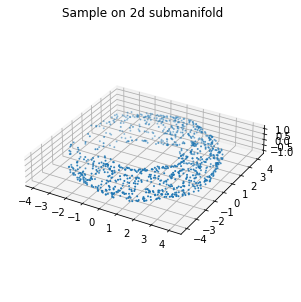

In [34]:
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(111, projection='3d')

#manifold_pts = manifold_pts.reshape(1000, 1000, 3)

scale = np.diag([4., 4., 1., 1])
scale=scale*(1.0/scale.max())
scale[3,3]=1.0
ax.get_proj = lambda: np.dot(Axes3D.get_proj(ax), scale)


ax.scatter(manifold_pts[:, 0], manifold_pts[:, 1], manifold_pts[:, 2].numpy(), s=1.)

plt.title('Sample on 2d submanifold')
plt.show()

In [35]:
expected_rate = -.667
d = 2
beta = 2.

x = torch.tensor([1. + b, a, 0.])

def density_at_zero(norm_const, a, b, w):
    return 1. / (norm_const * 2 * pi)**2 * ((1. + a**2 * w**2) * ((b+1)**2 + a**2*w**2) - a**2*w**2)**(-.5)

unnormed_g = partial(example_1d_density, beta=beta)
norm_const = compute_norm_constant(unnormed_g, -.5, .5, n_pts=10000)

density_at_zero(norm_const, a, b, w)

f_gt = density_at_zero(norm_const, a, b, w)

def sample_f(beta, n_pts):
    pts = example_2d_density_sampling(beta, int(n_pts))
    manifold_pts = example_parametric_surface(pts[:, 0], pts[:, 1], a=a, b=b, w=w)

    return manifold_pts

21it [00:15,  1.37it/s]
Estimated rate: -0.6585, expected rate: -0.667


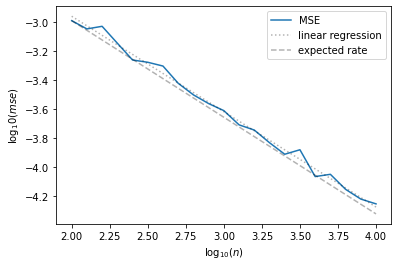

In [36]:
N = 500
grid = np.logspace(np.log(100) / np.log(10), np.log(1e4) / np.log(10), 21)
#beta = 2
l = beta

kernel = Kernel(l, d)

coef, bias, mse_n = collect_mse_convergence(beta, kernel, sample_f, x, f_gt, grid, N)
grid = grid[:len(mse_n)]

print(f'Estimated rate: {coef[0]:.4f}, expected rate: {expected_rate}')

plot_convergence(grid, mse_n, coef, bias, expected_rate, savepath=f'figs/2d_manifold_experiment_l={int(l)}.png')

11it [02:53, 15.81s/it]
Estimated rate: -0.6904, expected rate: -0.667


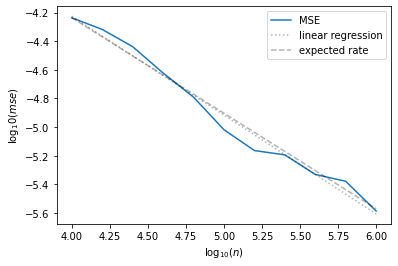

In [37]:
N = 100
grid = np.logspace(np.log(1e4) / np.log(10), np.log(1e6) / np.log(10), 11)
l = 2.

kernel = Kernel(l, d)

coef, bias, mse_n = collect_mse_convergence(beta, kernel, sample_f, x, f_gt, grid, N) #, f_max, theta)
grid = grid[:len(mse_n)]

print(f'Estimated rate: {coef[0]:.4f}, expected rate: {expected_rate}')

plot_convergence(grid, mse_n, coef, bias, expected_rate, savepath=f'figs/2d_manifold_2_experiment_l={int(l)}.png', error_name='MSE')

11it [03:52, 21.18s/it]
Estimated rate: -0.3218, expected rate: -0.667


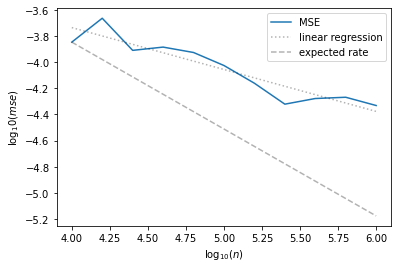

In [38]:
N = 100
grid = np.logspace(np.log(1e4) / np.log(10), np.log(1e6) / np.log(10), 11)
l = 3.

kernel = Kernel(l, d)

coef, bias, mse_n = collect_mse_convergence(beta, kernel, sample_f, x, f_gt, grid, N) #, f_max, theta)
grid = grid[:len(mse_n)]

print(f'Estimated rate: {coef[0]:.4f}, expected rate: {expected_rate}')

plot_convergence(grid, mse_n, coef, bias, expected_rate, savepath=f'figs/2d_manifold_2_experiment_l={int(l)}.png', error_name='MSE')

## Adaptation

In [45]:
expected_rate = -.8
d = 1 
beta = 2.

x = torch.tensor([1. + a, 0.])

unnormed_g = partial(example_1d_density, beta=beta)
norm_const = compute_norm_constant(unnormed_g, -.5, .5, n_pts=10000)

def density_at_zero(norm_const, a, w):
    return 1. / (norm_const * 2 * pi * (1. + a * w))

f_gt = density_at_zero(norm_const, a, w)

pts = examlpe_1d_density_sampling(beta, int(1e4))
f_max = submonifold_density(pts).max().item()

def sample_f(beta, n_pts):
    pts = examlpe_1d_density_sampling(beta, int(n_pts))
    manifold_pts = example_parametric_curve(pts, a=a, w=w)
    return manifold_pts

2it [00:00,  6.81it/s]bandwidth: 1.0000, optimal: 0.3981
bandwidth: 1.0000, optimal: 0.3807
3it [00:00,  6.41it/s]bandwidth: 1.0000, optimal: 0.3633
4it [00:00,  5.84it/s]bandwidth: 1.0000, optimal: 0.3469
5it [00:00,  4.94it/s]bandwidth: 1.0000, optimal: 0.3312
6it [00:01,  4.53it/s]bandwidth: 1.0000, optimal: 0.3163
7it [00:01,  3.97it/s]bandwidth: 1.0000, optimal: 0.3020
8it [00:01,  3.44it/s]bandwidth: 1.0000, optimal: 0.2884
9it [00:02,  3.09it/s]bandwidth: 1.0000, optimal: 0.2755
10it [00:02,  2.53it/s]bandwidth: 1.0000, optimal: 0.2630
11it [00:03,  2.22it/s]bandwidth: 1.0000, optimal: 0.2512
12it [00:04,  1.87it/s]bandwidth: 1.0000, optimal: 0.2399
13it [00:05,  1.57it/s]bandwidth: 1.0000, optimal: 0.2291
14it [00:06,  1.31it/s]bandwidth: 1.0000, optimal: 0.2188
15it [00:07,  1.06it/s]bandwidth: 1.0000, optimal: 0.2089
16it [00:09,  1.14s/it]bandwidth: 1.0000, optimal: 0.1995
17it [00:11,  1.40s/it]bandwidth: 1.0000, optimal: 0.1905
18it [00:13,  1.76s/it]bandwidth: 1.0000, opt

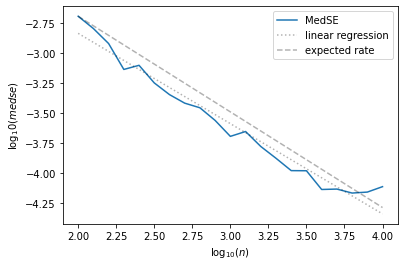

In [40]:
N = 500
grid = np.logspace(np.log(100) / np.log(10), np.log(1e4) / np.log(10), 21)
#beta = 2
l = 3.
theta = 2.

kernel = Kernel(l, d)

coef, bias, mse_n = collect_mse_convergence_adaptation(beta, kernel, sample_f, x, f_gt, grid, N, f_max, theta)
grid = grid[:len(mse_n)]

print(f'Estimated rate: {coef[0]:.4f}, expected rate: {expected_rate}')

plot_convergence(grid, mse_n, coef, bias, expected_rate, savepath=f'figs/1d_manifold_adaptation_experiment_l={int(l)}.png', error_name='MedSE')

In [47]:
# N = 100
# grid = np.logspace(np.log(1e4) / np.log(10), np.log(1e5) / np.log(10), 11)

# l = 2.
# theta = 2. 

# kernel = Kernel(l, d)

# coef, bias, mse_n = collect_mse_convergence_adaptation(beta, kernel, sample_f, x, f_gt, grid, N, f_max, theta)
# grid = grid[:len(mse_n)]

# print(f'Estimated rate: {coef[0]:.4f}, expected rate: {expected_rate}')

# plot_convergence(grid, mse_n, coef, bias, expected_rate, savepath=f'figs/1d_manifold_adaptation_2_experiment_l={int(l)}.png', error_name='MedSE')

In [52]:
expected_rate = -.667
d = 2
beta = 2.

x = torch.tensor([1. + b, a, 0.])

def density_at_zero(norm_const, a, b, w):
    return 1. / (norm_const * 2 * pi)**2 * ((1. + a**2 * w**2) * ((b+1)**2 + a**2*w**2) - a**2*w**2)**(-.5)

lamda = 1.

unnormed_g = partial(example_1d_density, beta=beta, lamda=lamda)
norm_const = compute_norm_constant(unnormed_g, -.5, .5, n_pts=10000)

density_at_zero(norm_const, a, b, w)

f_gt = density_at_zero(norm_const, a, b, w)


def sample_f(beta, n_pts):
    pts = example_2d_density_sampling(beta, int(n_pts), lamda=lamda)
    manifold_pts = example_parametric_surface(pts[:, 0], pts[:, 1], a=a, b=b, w=w)

    return manifold_pts

2it [00:00,  8.65it/s]bandwidth: 1.0000, optimal: 0.4642
bandwidth: 1.0000, optimal: 0.4472
4it [00:00,  8.43it/s]bandwidth: 1.0000, optimal: 0.4301
bandwidth: 1.0000, optimal: 0.4139
6it [00:00,  6.79it/s]bandwidth: 1.0000, optimal: 0.3982
bandwidth: 1.0000, optimal: 0.3832
7it [00:01,  5.61it/s]bandwidth: 1.0000, optimal: 0.3687
8it [00:01,  4.70it/s]bandwidth: 1.0000, optimal: 0.3548
9it [00:01,  3.97it/s]bandwidth: 1.0000, optimal: 0.3415
10it [00:02,  3.32it/s]bandwidth: 1.0000, optimal: 0.3286
11it [00:02,  2.98it/s]bandwidth: 1.0000, optimal: 0.3162
12it [00:03,  2.58it/s]bandwidth: 1.0000, optimal: 0.3044
13it [00:03,  2.10it/s]bandwidth: 1.0000, optimal: 0.2929
14it [00:04,  1.71it/s]bandwidth: 1.0000, optimal: 0.2818
15it [00:05,  1.49it/s]bandwidth: 1.0000, optimal: 0.2712
16it [00:06,  1.16it/s]bandwidth: 1.0000, optimal: 0.2610
17it [00:08,  1.04s/it]bandwidth: 1.0000, optimal: 0.2512
18it [00:10,  1.28s/it]bandwidth: 1.0000, optimal: 0.2417
19it [00:12,  1.58s/it]bandwidt

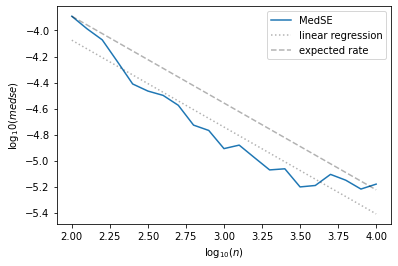

In [53]:
N = 500
grid = np.logspace(np.log(100) / np.log(10), np.log(1e4) / np.log(10), 21)
#beta = 2
l = 2.
theta = 2.
f_max = f_gt.item() + 1.

kernel = Kernel(l, d)

coef, bias, mse_n = collect_mse_convergence_adaptation(beta, kernel, sample_f, x, f_gt, grid, N, theta, f_max)
grid = grid[:len(mse_n)]

print(f'Estimated rate: {coef[0]:.4f}, expected rate: {expected_rate}')

plot_convergence(grid, mse_n, coef, bias, expected_rate, savepath=f'figs/2d_manifold_adaptation_experiment_l={int(l)}.png', error_name='MedSE')

1it [00:01,  1.98s/it]bandwidth: 1.0000, optimal: 0.2154
2it [00:04,  2.09s/it]bandwidth: 1.0000, optimal: 0.1995
3it [00:07,  2.55s/it]bandwidth: 1.0000, optimal: 0.1848
4it [00:13,  3.44s/it]bandwidth: 1.0000, optimal: 0.1711
5it [00:22,  4.99s/it]bandwidth: 1.0000, optimal: 0.1585
6it [00:35,  7.56s/it]bandwidth: 1.0000, optimal: 0.1468
7it [00:57, 11.78s/it]bandwidth: 1.0000, optimal: 0.1359
8it [01:29, 18.06s/it]bandwidth: 1.0000, optimal: 0.1259
9it [02:23, 28.66s/it]bandwidth: 1.0000, optimal: 0.1166
10it [03:44, 44.29s/it]bandwidth: 1.0000, optimal: 0.1080
11it [05:56, 32.43s/it]bandwidth: 1.0000, optimal: 0.1000
Estimated rate: -0.0046, expected rate: -0.667



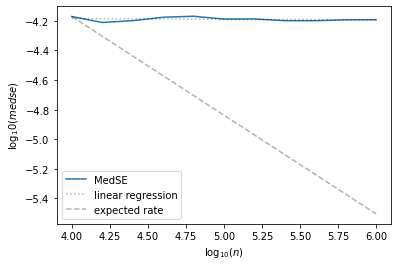

In [48]:
# N = 100
# grid = np.logspace(np.log(1e4) / np.log(10), np.log(1e6) / np.log(10), 11)
# #beta = 2
# l = 3.
# theta = 2.
# f_max = f_gt.item() + 1.

# kernel = Kernel(l, d)

# coef, bias, mse_n = collect_mse_convergence_adaptation(beta, kernel, sample_f, x, f_gt, grid, N, theta, f_max)
# grid = grid[:len(mse_n)]

# print(f'Estimated rate: {coef[0]:.4f}, expected rate: {expected_rate}')

# plot_convergence(grid, mse_n, coef, bias, expected_rate, savepath=f'figs/2d_manifold_adaptation_2_experiment_l={int(l)}.png', error_name='MedSE')